- IZTECH CENG506 TERM PROJECT
- BURAK SALER 260201032

# Term Project
## Instructions

* A dataset of animal images (4 classes). (download it from Microsoft Teams Term Project Assignment Page. It has one folder for each class.)
* You are encouraged to use Python. But other languages will be accepted.
* You will perform image classification. You’re expected to use transfer learning (e.g. AlexNet, VGG, ResNet etc ) and compare the results with the version w/o transfer learning, i.e. Transfer learning vs. training from scratch.
* You’re expected to use visualization tools (training curves, correct/miss classification comparison images, result comparison graphs etc).
* **Group work is not allowed**.
* You’re expected to use best practices we have seen in the lecture such as hyperparameter search, cross-validation, regularization etc.
* Grading will depend on the level of your elaboration.
* If you are submitting a Python notebook please write your comments (about models, hyperparameters, results) on the notebook as **markdown** (you can check [this](https://www.markdownguide.org/cheat-sheet/) for markdown tutorial.).
* If you are not using a Python notebook, then, with your code file, please submit a separate report (pdf file) and show your results and add your comments.

# Deadline, June 7, 5 PM

### LOAD AND PREPROCESS DATA

In [1]:
import numpy as np
from sklearn import datasets
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from matplotlib import pyplot as plt
from sklearn.model_selection import GridSearchCV
import torch.optim as optim
import torch
import torchvision
import torchvision.datasets
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torch.utils.data import DataLoader, random_split
from torch import nn
from torchsummary import summary
import torch.utils.data
from sklearn.model_selection import KFold

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


DATA AUGMENTATION

In [4]:
# define transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the images to a specific size
    transforms.RandomHorizontalFlip(p=0.5),
    # transforms.RandomVerticalFlip(p=0.5),
    # transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
    transforms.RandomRotation(degrees=(30, 70)),
    transforms.ToTensor(),  # Convert the images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize the images
])

In [5]:
# get the data from google drive
DATA_DIR = '/content/drive/MyDrive/ceng506_term/dataset'
dataset = torchvision.datasets.ImageFolder(DATA_DIR, transform=transform)


Train and validation split

In [6]:
total_size = len(dataset)
train_size = int(0.8 * total_size)  # 80% for train
val_size = total_size - train_size

In [7]:
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

In [8]:
len(train_dataset)

1120

Put dataset into DataLoader.

In [9]:
# Hyperparameters
batch_size = 32 # Batchsize=32 gave better results than 64. So I selected 32.

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [10]:
train_features, train_labels = next(iter(train_loader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")


Feature batch shape: torch.Size([32, 3, 224, 224])
Labels batch shape: torch.Size([32])


In [11]:
N = len(train_loader) #Number of training points
H = train_features.size()[2]
W = train_features.size()[3]
d = 3*W*H #Number of features
C = 4 #Number of classes

In [12]:
# TO SHOW LABEL NAMES IN PLOTS
NUM_TO_LABEL=['BEAR','ELEPHANT','TIGER', 'ZEBRA']

A QUICK GLANCE

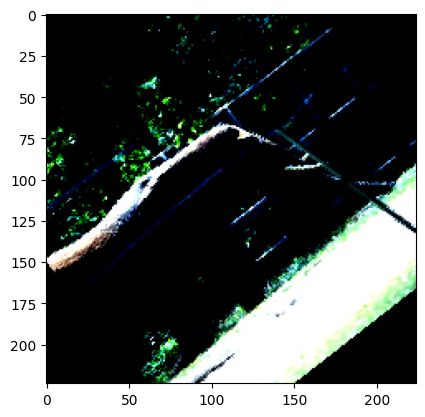

In [13]:
img = train_features[5].squeeze()
label = train_labels[5]
plt.imshow(img.permute(1, 2, 0))
plt.show()
print(f"Label: {NUM_TO_LABEL[label]}")

### PLOT FUNCTIONS

PLOT TRAINING LOSS, VALIDATION LOSS AND ACCURACY

In [14]:
def plot(trainingEpoch_loss, validationEpoch_loss, accuracies, epochs):
  figure, axis = plt.subplots(1,2,figsize=(10, 5))
  axis[0].plot(trainingEpoch_loss, label='Training Loss')
  axis[0].plot(validationEpoch_loss,label='Validation Loss')
  axis[0].set_title("Train and validation Loss")
  axis[1].plot(accuracies, label='Accuracy')
  axis[1].set_title("Accuracy")
  axis[0].legend()
  axis[0].set_ylim(bottom=0)
  axis[1].set_ylim(bottom=0)
  axis[0].set_xlim(left=0)
  axis[1].set_xlim(left=0,right=epochs)
  axis[0].set_xlabel("Epochs")
  axis[1].set_xlabel("Epochs")

  plt.show()

Label: ELEPHANT


PLOT correct/miss classification comparison images

In [15]:
def plot_miss_correct(image, title):
  plt.imshow(np.transpose(image, (1, 2, 0)))
  plt.title(title)
  plt.axis('off')
  plt.show()

### TRAINING FUNCTION

I took this function from the notebook used in class and modified it.

In [16]:
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)


In [17]:
def train_log_loss_network(model, train_loader, val_loader=None, epochs=20, device="cpu"):
  loss_fn = nn.CrossEntropyLoss() #CrossEntropy is another name for the Logistic Regression loss function. Like before, we phrase learning as minimize a loss function. This is the loss we are going to minimize!

  #We need an optimizer! Adam is a good default one that works "well enough" for most problems
  #To tell Adam what to optimize, we give it the model's parameters - because thats what the learning will adjust
  optimizer = optim.Adam(model.parameters())

  #Devices can be spcified by a string, or a special torch object
  #If it is a string, lets get the correct device
  if device.__class__ == str:
    device = torch.device(device)

  model.to(device)#Place the model on the correct compute resource

  # Create lists to plot loss and accuracy
  trainingEpoch_loss = []
  validationEpoch_loss = []
  accuracies = []
  for epoch in range(epochs):

    model = model.train()#Put our model in training mode
    running_loss = 0.0
    training_step_loss = []
    for inputs, labels in train_loader:

      #Move the batch to the device we are using.
      inputs = inputs.to(device)
      labels = labels.to(device)

      # zero the parameter gradients
      optimizer.zero_grad()

      y_pred = model(inputs)

      # Compute loss.
      loss = loss_fn(y_pred, labels.long())

      # Backward pass: compute gradient of the loss with respect to model parameters
      loss.backward()

      # Calling the step function on an Optimizer makes an update to its parameters
      optimizer.step()

      running_loss += loss.item() * inputs.size(0)
      training_step_loss.append(running_loss)
    trainingEpoch_loss.append(np.array(training_step_loss).mean())

    if val_loader is None:
      print("Loss after epoch {} is {}".format(epoch, running_loss))
    else:#Lets find out validation performance as we go!
      model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!

      # THESE ARE FOR PLOTTING
      total_val_loss=0
      targets = []
      predictions = []
      step_loss = []
      correct_images = []
      correct_labels = []
      correct_predictions = []
      misclassified_images = []
      misclassified_labels = []
      misclassified_predictions = []

      for inputs, labels in val_loader:

        #Move the batch to the device we are using.
        inputs = inputs.to(device)
        labels = labels.to(device)

        y_pred = model(inputs)

        # Get Validation Loss
        val_loss = loss_fn(y_pred, labels)
        total_val_loss += val_loss.item() * inputs.size(0)
        step_loss.append(total_val_loss)

        # Get correct and incorrect predictions, images and labels
        _, predicted = torch.max(y_pred, 1)
        for i in range(len(predicted)):
          if predicted[i] == labels[i]:
            correct_images.append(inputs[i])
            correct_labels.append(labels[i])
            correct_predictions.append(predicted[i])
          else:
            misclassified_images.append(inputs[i])
            misclassified_labels.append(labels[i])
            misclassified_predictions.append(predicted[i])
        # Get predicted classes
        # y_pred will have a shape (Batch_size, C)
        #We are asking for which class had the largest response along dimension #1, the C dimension
        for pred in torch.argmax(y_pred, dim=1).cpu().numpy():
          predictions.append(pred)
        for l in labels.cpu().numpy():
          targets.append(l)

      validationEpoch_loss.append(np.array(step_loss).mean())
      accuracy = accuracy_score(predictions, targets)
      accuracies.append(accuracy)
      #print("Network Accuracy: ", )
      print("Loss after epoch {} is {}. Accuracy: {}".format(epoch+1, running_loss, accuracy))

  print("Correctly classified images:")
  num_correct_images = 5
  for i in range(num_correct_images):
    plot_miss_correct(correct_images[i].cpu().numpy(), f"True: {NUM_TO_LABEL[correct_labels[i]]}, Predicted: {NUM_TO_LABEL[correct_predictions[i]]}")

    # Visualize misclassified images
  print("Misclassified images:")
  num_misclassified_images = min(5, len(misclassified_images))
  for i in range(num_misclassified_images):
      plot_miss_correct(misclassified_images[i].cpu().numpy(), f"True: {NUM_TO_LABEL[misclassified_labels[i]]}, Predicted: {NUM_TO_LABEL[misclassified_predictions[i]]}")
  plot(trainingEpoch_loss, validationEpoch_loss, accuracies, epochs)
  return accuracy



### MODEL FROM SCRATCH

In [18]:
class GlobalMaxPool2d(nn.Module):
    def forward(self, input):
        return nn.functional.max_pool2d(input, kernel_size=input.size()[2:])

First, I took the model from the notebook used in class. Then I modified it a lot. This is the last version and the best one I could get. Since I run this notebook on Google Colab, GPU is limited so I could not make it much more complex.

In [19]:
model_fully_conv = nn.Sequential(
  nn.Conv2d(3, 64, 3, padding=1),
  nn.BatchNorm2d(64),
  nn.Dropout2d(p=0.25),
  nn.ReLU(),
  nn.Conv2d(64, 64, 3, padding=1),
  nn.BatchNorm2d(64),
  nn.Dropout2d(p=0.25),
  nn.MaxPool2d(2),
  nn.ReLU(),
  nn.Conv2d(64, 128, 3, padding=1),
  nn.BatchNorm2d(128),
  nn.Dropout2d(p=0.25),
  nn.MaxPool2d(2),
  nn.ReLU(),
  nn.Conv2d(128, 128, 3, padding=1),
  nn.BatchNorm2d(128),
  nn.Dropout2d(p=0.25),
  nn.ReLU(),
  #Now do a convolution with C filters, one for each class, and then perform global-max-pooling
  nn.Conv2d(128, C, 5), # it does not matter current H and W
  GlobalMaxPool2d(), # after global pooling H=1 and W=1
  Flatten()
)

Loss after epoch 1 is 1579.5430641174316. Accuracy: 0.4607142857142857
Loss after epoch 2 is 1264.1137809753418. Accuracy: 0.5964285714285714
Loss after epoch 3 is 1147.8104972839355. Accuracy: 0.6892857142857143
Loss after epoch 4 is 995.2921810150146. Accuracy: 0.7142857142857143
Loss after epoch 5 is 927.7470855712891. Accuracy: 0.7642857142857142
Loss after epoch 6 is 814.2349462509155. Accuracy: 0.7464285714285714
Loss after epoch 7 is 825.5996780395508. Accuracy: 0.7392857142857143
Loss after epoch 8 is 794.7029638290405. Accuracy: 0.775
Loss after epoch 9 is 722.1144142150879. Accuracy: 0.825
Loss after epoch 10 is 663.0368814468384. Accuracy: 0.7928571428571428
Loss after epoch 11 is 677.1229486465454. Accuracy: 0.7857142857142857
Loss after epoch 12 is 676.4404487609863. Accuracy: 0.7892857142857143
Loss after epoch 13 is 624.3751096725464. Accuracy: 0.8214285714285714
Loss after epoch 14 is 631.944167137146. Accuracy: 0.85
Loss after epoch 15 is 631.6005373001099. Accuracy: 0

Loss after epoch 20 is 563.846586227417. Accuracy: 0.8571428571428571
Correctly classified images:


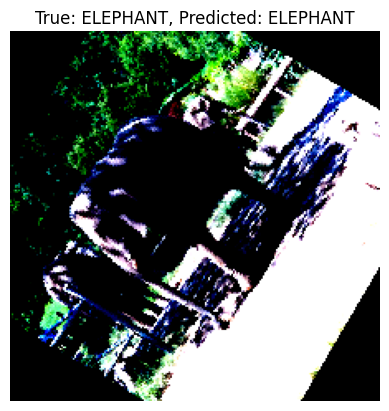

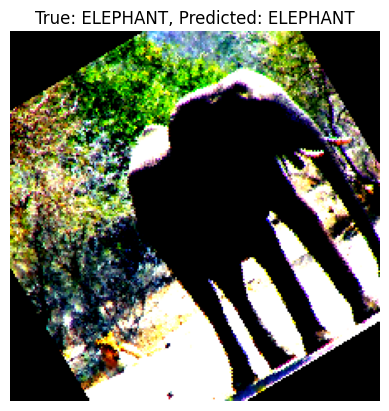

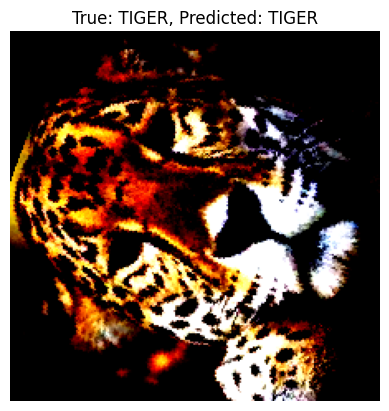

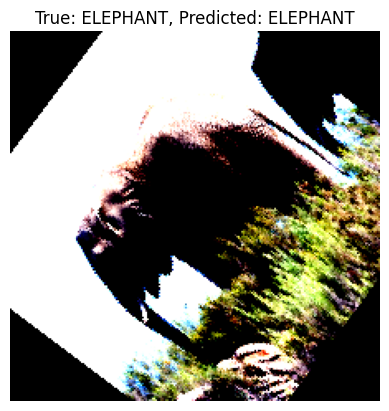

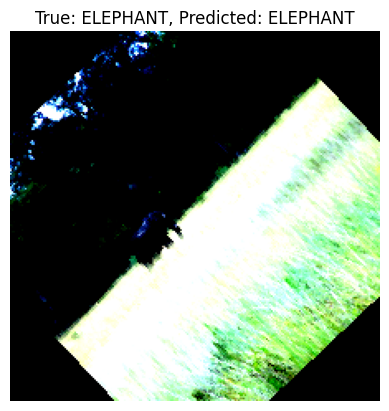

Misclassified images:


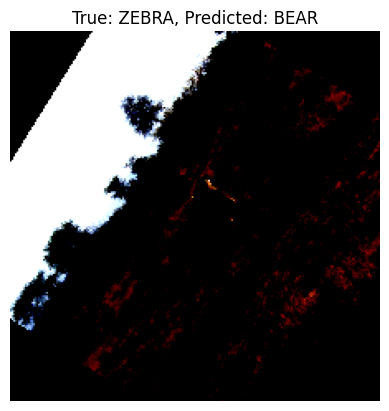

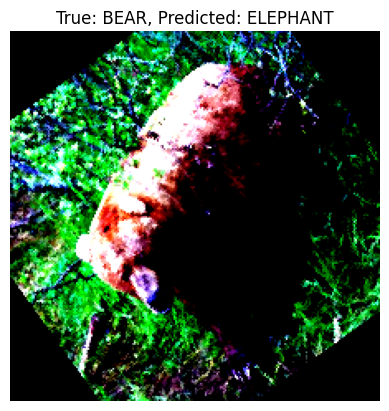

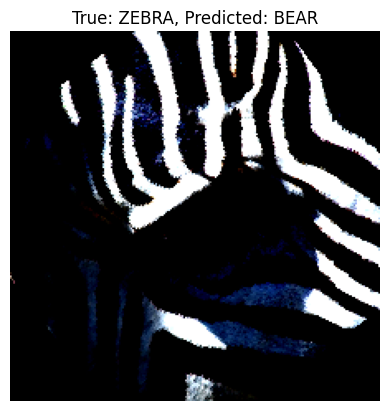

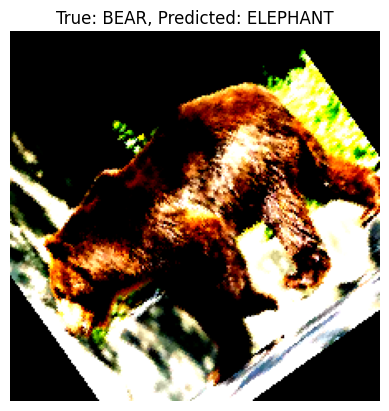

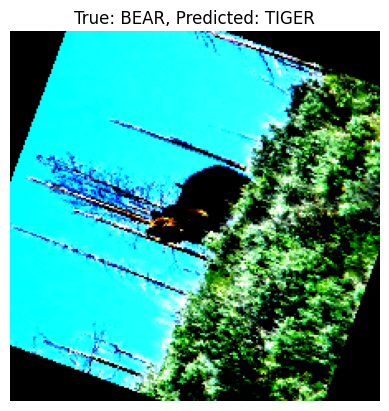

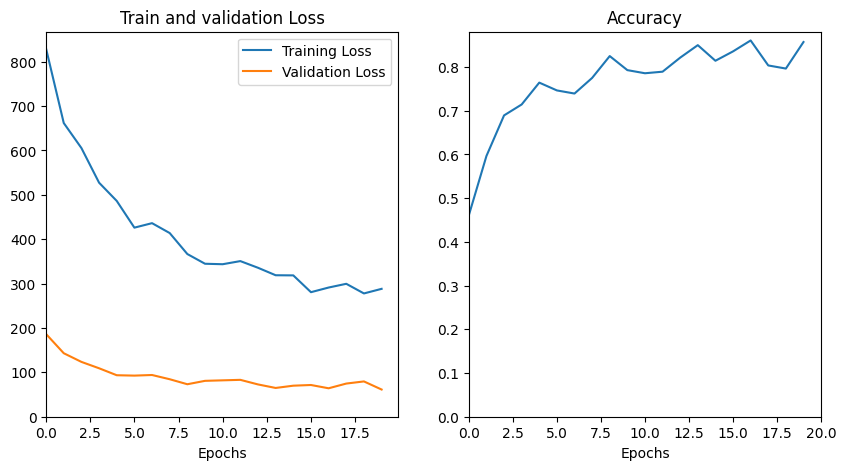

0.8571428571428571

In [20]:
train_log_loss_network(model_fully_conv, train_loader, val_loader=val_loader, epochs=20, device=device)

In [21]:
summary(model_fully_conv,(3, H, W))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
         Dropout2d-3         [-1, 64, 224, 224]               0
              ReLU-4         [-1, 64, 224, 224]               0
            Conv2d-5         [-1, 64, 224, 224]          36,928
       BatchNorm2d-6         [-1, 64, 224, 224]             128
         Dropout2d-7         [-1, 64, 224, 224]               0
         MaxPool2d-8         [-1, 64, 112, 112]               0
              ReLU-9         [-1, 64, 112, 112]               0
           Conv2d-10        [-1, 128, 112, 112]          73,856
      BatchNorm2d-11        [-1, 128, 112, 112]             256
        Dropout2d-12        [-1, 128, 112, 112]               0
        MaxPool2d-13          [-1, 128, 56, 56]               0
             ReLU-14          [-1, 128,

### MODEL FROM SCRATCH WITH CROSS VAL

In [22]:
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True)

Fold 1/5
Loss after epoch 1 is 638.1315441131592. Accuracy: 0.8428571428571429
Loss after epoch 2 is 532.6395483016968. Accuracy: 0.8321428571428572
Loss after epoch 3 is 499.2116918563843. Accuracy: 0.8357142857142857
Loss after epoch 4 is 530.020013332367. Accuracy: 0.8142857142857143
Loss after epoch 5 is 510.3425965309143. Accuracy: 0.8428571428571429
Loss after epoch 6 is 559.5899658203125. Accuracy: 0.8464285714285714
Loss after epoch 7 is 537.5003304481506. Accuracy: 0.8714285714285714
Loss after epoch 8 is 474.0617151260376. Accuracy: 0.8357142857142857
Loss after epoch 9 is 489.3315963745117. Accuracy: 0.8642857142857143
Loss after epoch 10 is 486.43236446380615. Accuracy: 0.8321428571428572
Loss after epoch 11 is 504.1101379394531. Accuracy: 0.8535714285714285
Loss after epoch 12 is 468.48132133483887. Accuracy: 0.8535714285714285
Loss after epoch 13 is 497.011554479599. Accuracy: 0.8785714285714286
Loss after epoch 14 is 466.8988800048828. Accuracy: 0.8607142857142858
Loss a

Loss after epoch 20 is 406.8330149650574. Accuracy: 0.85
Correctly classified images:


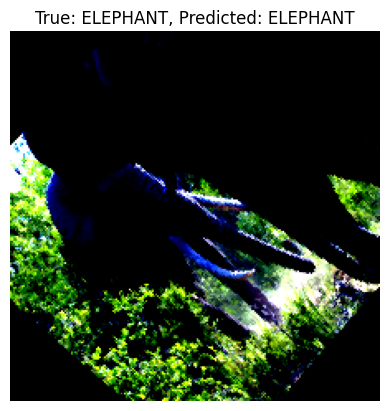

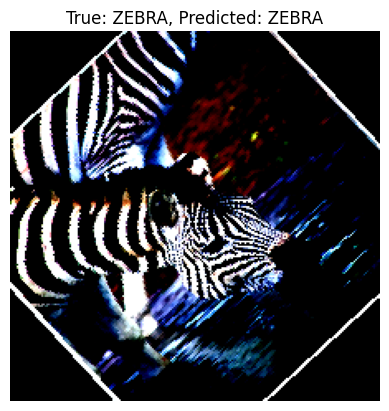

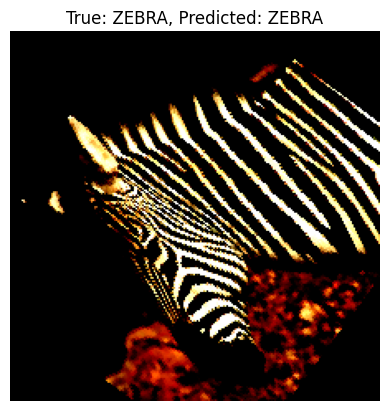

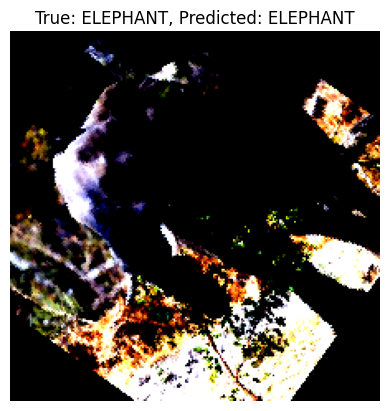

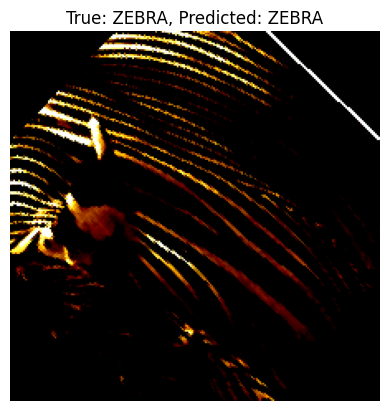

Misclassified images:


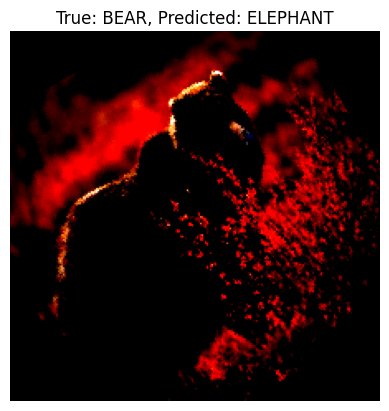

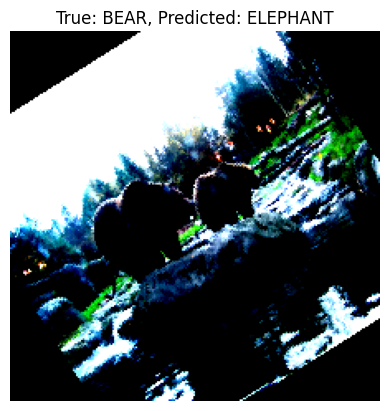

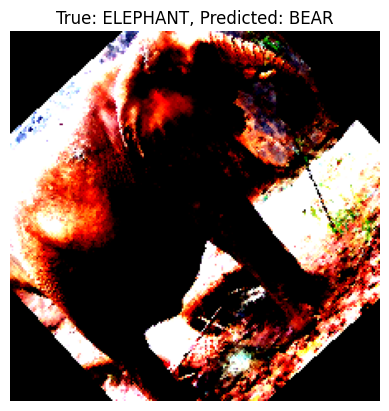

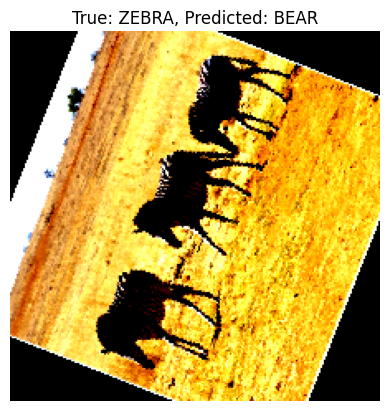

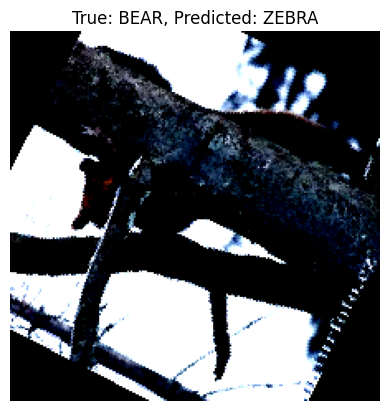

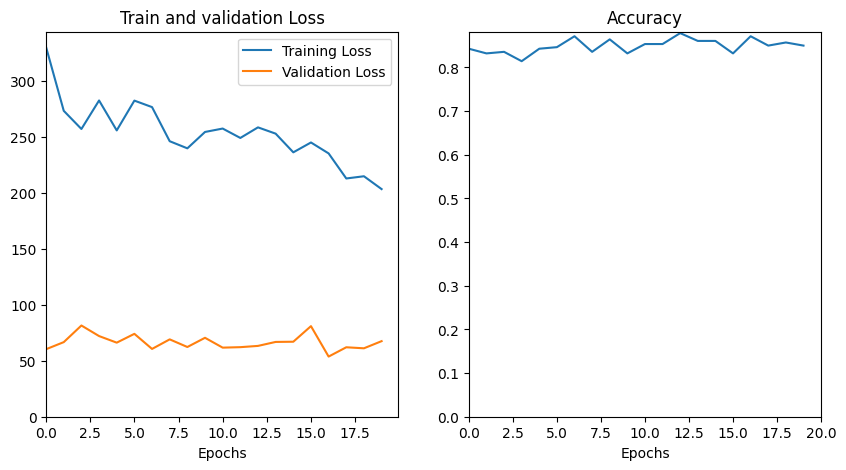

Fold 2/5
Loss after epoch 1 is 526.4144196510315. Accuracy: 0.9142857142857143
Loss after epoch 2 is 419.92960357666016. Accuracy: 0.9142857142857143
Loss after epoch 3 is 426.36511754989624. Accuracy: 0.9142857142857143
Loss after epoch 4 is 432.92640686035156. Accuracy: 0.9142857142857143
Loss after epoch 5 is 448.6645154953003. Accuracy: 0.8607142857142858
Loss after epoch 6 is 444.88309383392334. Accuracy: 0.8892857142857142
Loss after epoch 7 is 427.2771244049072. Accuracy: 0.8928571428571429
Loss after epoch 8 is 421.45462679862976. Accuracy: 0.8964285714285715
Loss after epoch 9 is 476.6344265937805. Accuracy: 0.8821428571428571
Loss after epoch 10 is 451.8199279308319. Accuracy: 0.8928571428571429
Loss after epoch 11 is 401.8991618156433. Accuracy: 0.9214285714285714
Loss after epoch 12 is 385.5304193496704. Accuracy: 0.875
Loss after epoch 13 is 425.3801712989807. Accuracy: 0.8714285714285714
Loss after epoch 14 is 396.3560700416565. Accuracy: 0.8785714285714286
Loss after epo

Loss after epoch 20 is 357.40202236175537. Accuracy: 0.875
Correctly classified images:


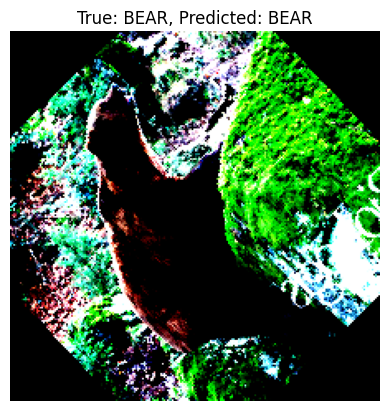

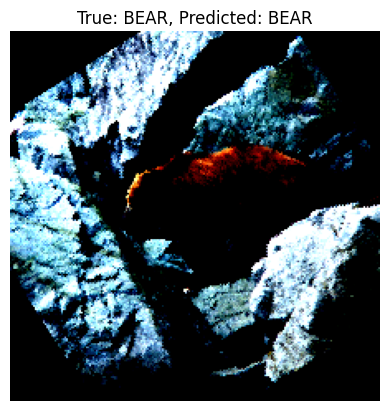

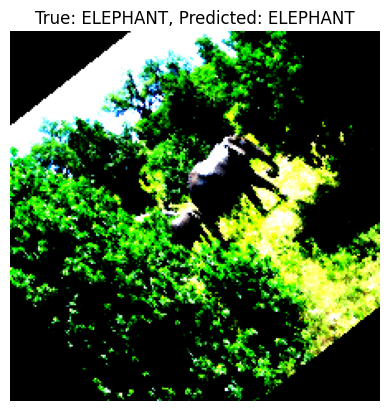

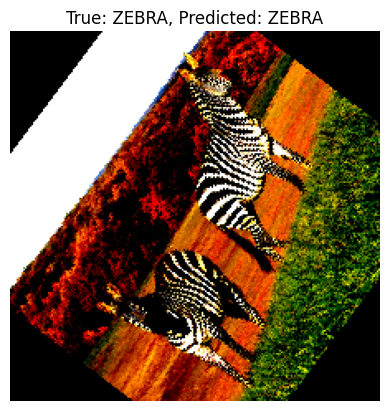

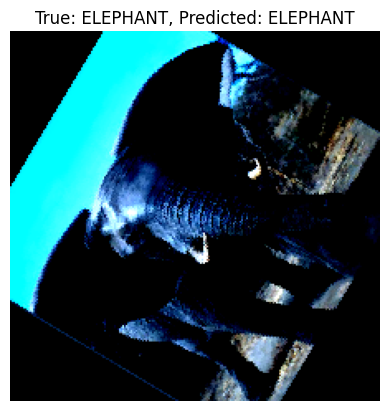

Misclassified images:


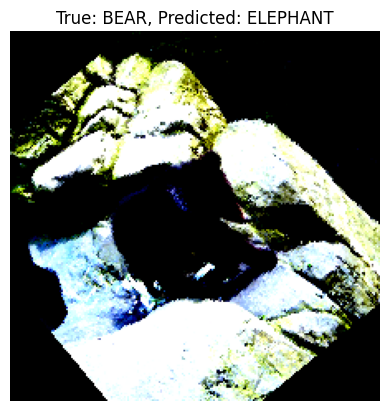

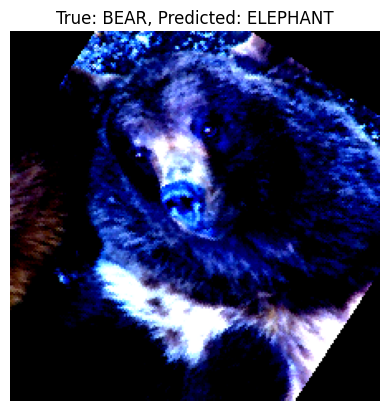

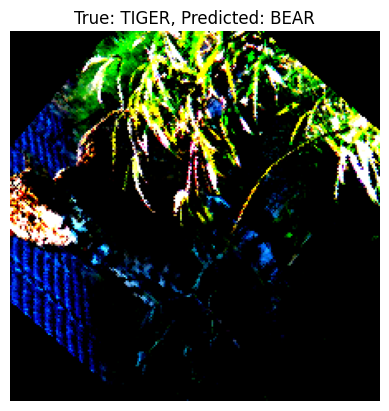

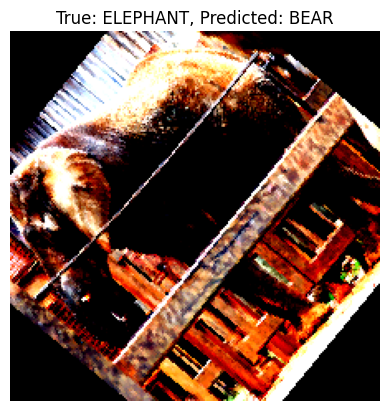

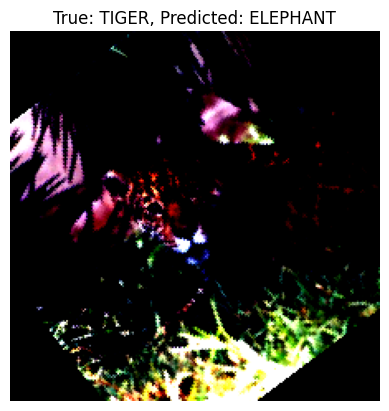

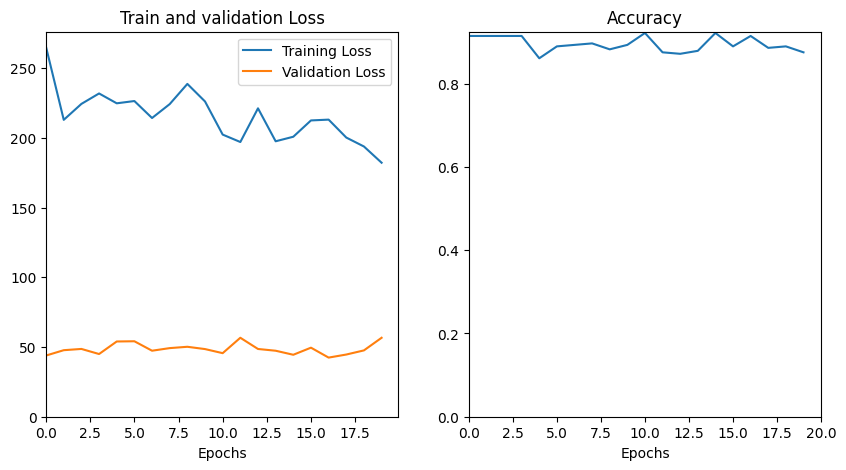

Fold 3/5
Loss after epoch 1 is 403.7655646800995. Accuracy: 0.9214285714285714
Loss after epoch 2 is 418.9447159767151. Accuracy: 0.9
Loss after epoch 3 is 412.57758617401123. Accuracy: 0.9142857142857143
Loss after epoch 4 is 365.7053508758545. Accuracy: 0.8892857142857142
Loss after epoch 5 is 366.53570556640625. Accuracy: 0.8928571428571429
Loss after epoch 6 is 371.4414267539978. Accuracy: 0.9071428571428571
Loss after epoch 7 is 354.0773227214813. Accuracy: 0.9071428571428571
Loss after epoch 8 is 353.00501346588135. Accuracy: 0.8821428571428571
Loss after epoch 9 is 346.7308883666992. Accuracy: 0.9
Loss after epoch 10 is 342.72165298461914. Accuracy: 0.9107142857142857
Loss after epoch 11 is 372.20506596565247. Accuracy: 0.9035714285714286
Loss after epoch 12 is 366.3869876861572. Accuracy: 0.9142857142857143
Loss after epoch 13 is 327.60353899002075. Accuracy: 0.9
Loss after epoch 14 is 318.26418471336365. Accuracy: 0.9142857142857143
Loss after epoch 15 is 321.6453447341919. Ac

Loss after epoch 20 is 348.5583794116974. Accuracy: 0.9107142857142857
Correctly classified images:


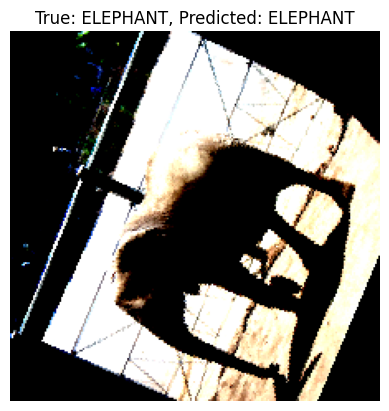

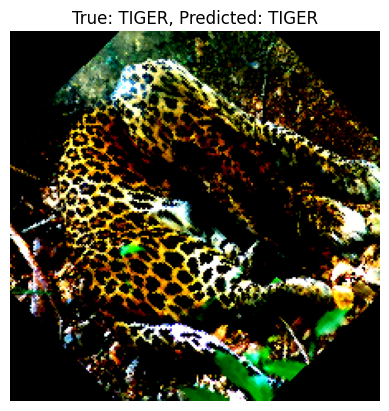

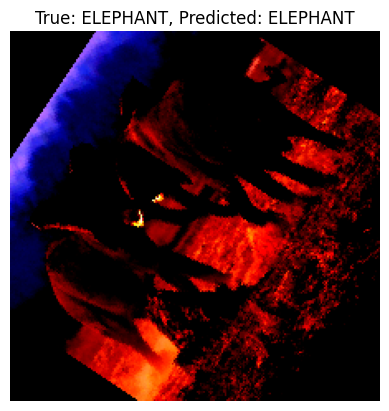

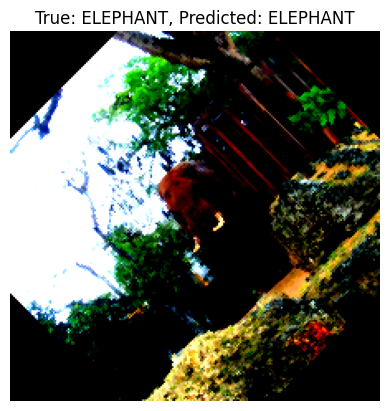

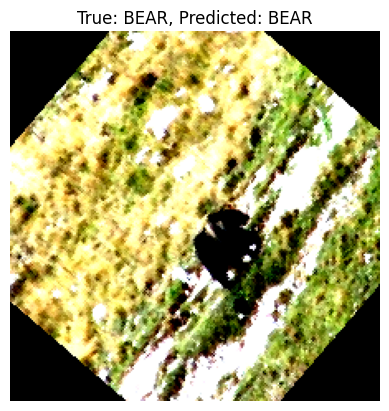

Misclassified images:


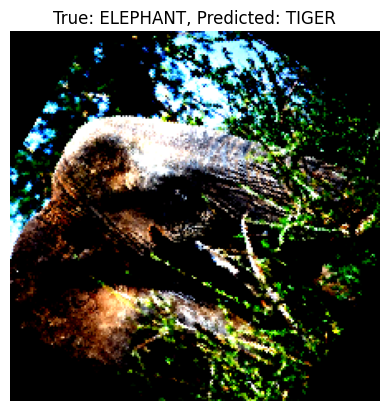

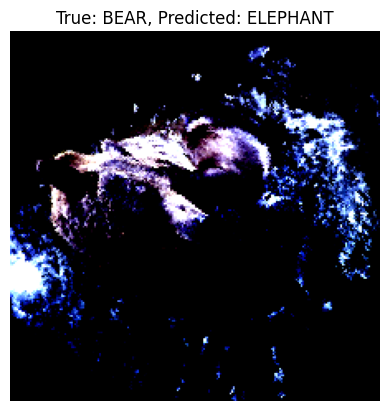

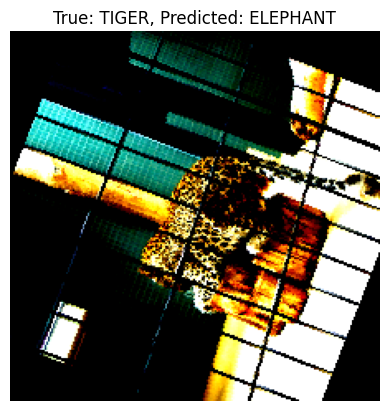

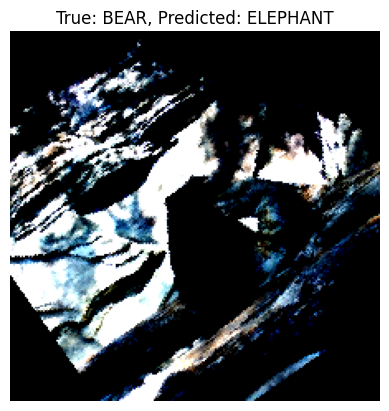

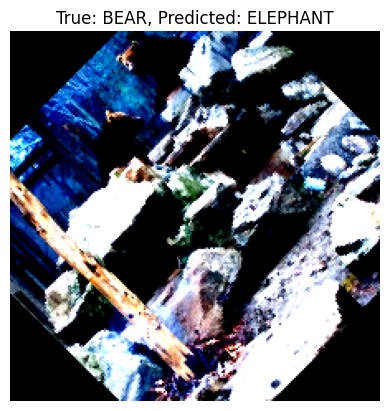

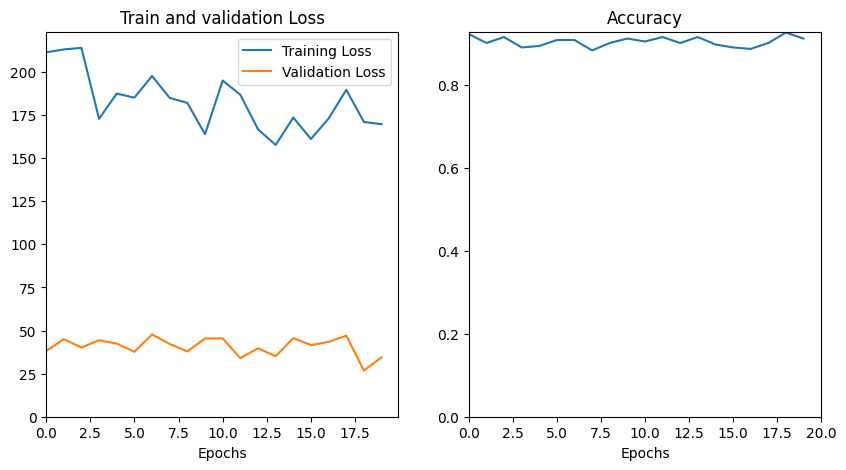

Fold 4/5
Loss after epoch 1 is 333.08318758010864. Accuracy: 0.9035714285714286
Loss after epoch 2 is 355.4012894630432. Accuracy: 0.9178571428571428
Loss after epoch 3 is 337.88417768478394. Accuracy: 0.9142857142857143
Loss after epoch 4 is 363.2534251213074. Accuracy: 0.8892857142857142
Loss after epoch 5 is 324.0787286758423. Accuracy: 0.925
Loss after epoch 6 is 292.41510558128357. Accuracy: 0.9071428571428571
Loss after epoch 7 is 322.1699285507202. Accuracy: 0.9178571428571428
Loss after epoch 8 is 338.9095690250397. Accuracy: 0.9
Loss after epoch 9 is 317.91079688072205. Accuracy: 0.9142857142857143
Loss after epoch 10 is 304.0949113368988. Accuracy: 0.9107142857142857
Loss after epoch 11 is 274.34769010543823. Accuracy: 0.9178571428571428
Loss after epoch 12 is 251.3965209722519. Accuracy: 0.9071428571428571
Loss after epoch 13 is 313.0717968940735. Accuracy: 0.9214285714285714
Loss after epoch 14 is 280.05318427085876. Accuracy: 0.9142857142857143
Loss after epoch 15 is 286.1

Loss after epoch 20 is 296.68470191955566. Accuracy: 0.9214285714285714
Correctly classified images:


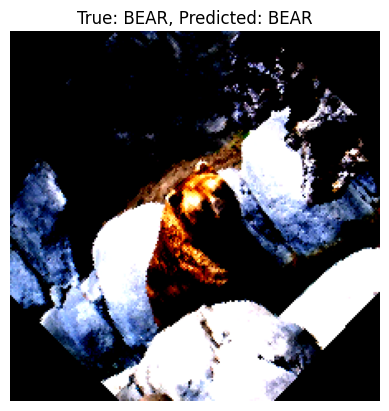

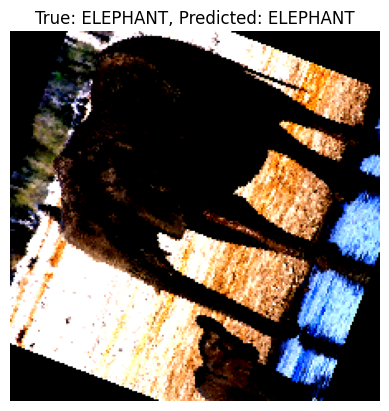

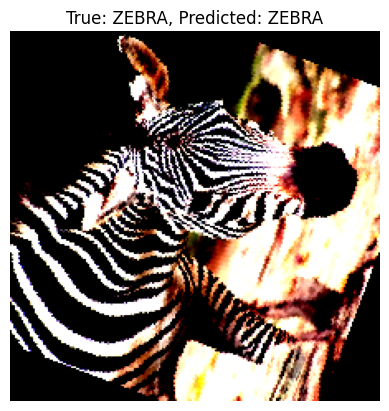

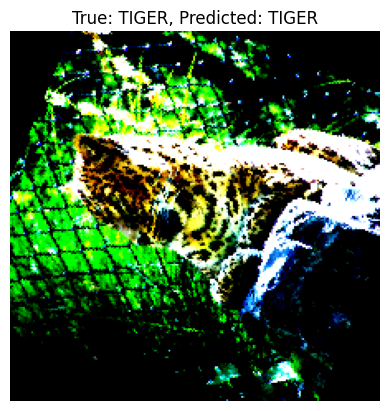

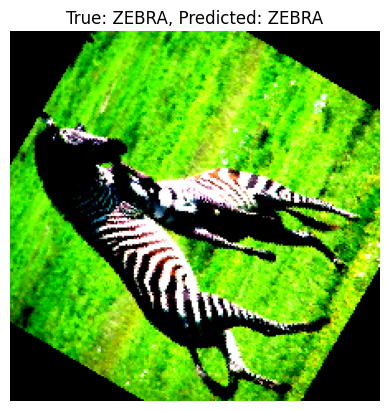

Misclassified images:


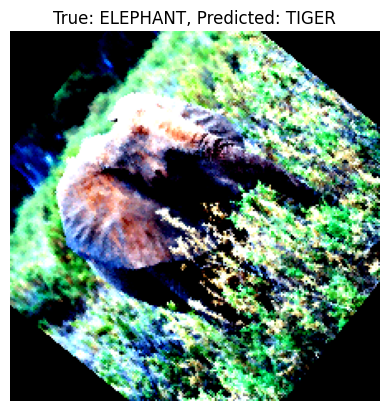

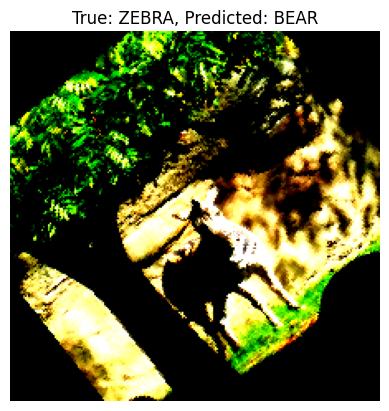

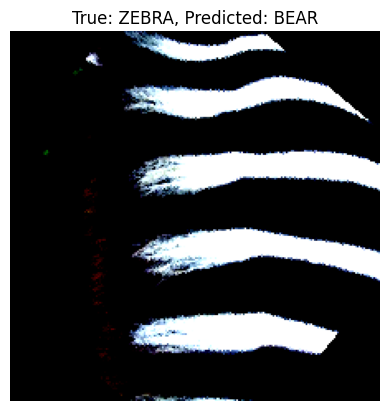

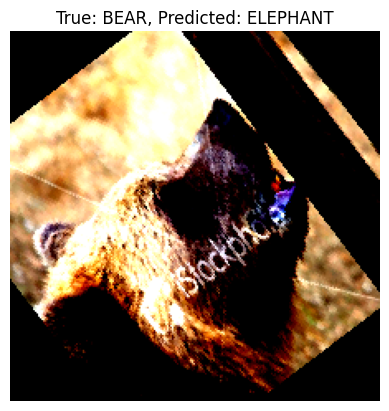

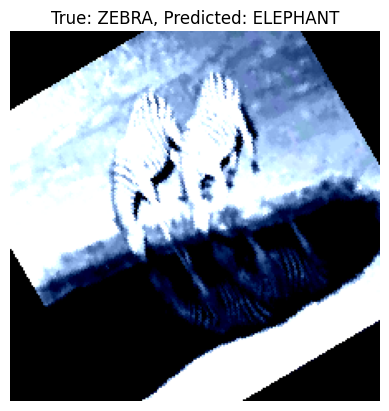

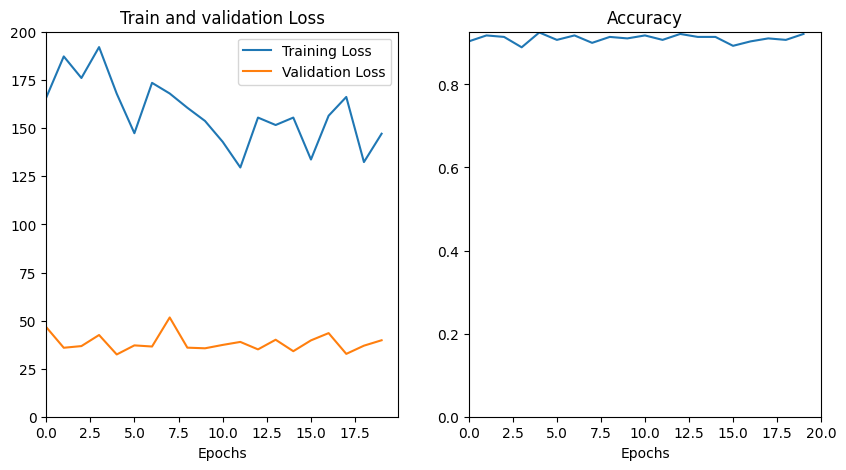

Fold 5/5
Loss after epoch 1 is 330.6098122596741. Accuracy: 0.9535714285714286
Loss after epoch 2 is 298.9865577220917. Accuracy: 0.95
Loss after epoch 3 is 305.4944500923157. Accuracy: 0.9535714285714286
Loss after epoch 4 is 312.9141569137573. Accuracy: 0.9357142857142857
Loss after epoch 5 is 315.7498161792755. Accuracy: 0.925
Loss after epoch 6 is 312.66061782836914. Accuracy: 0.9428571428571428
Loss after epoch 7 is 303.66087889671326. Accuracy: 0.9178571428571428
Loss after epoch 8 is 296.0162515640259. Accuracy: 0.9428571428571428
Loss after epoch 9 is 289.0322210788727. Accuracy: 0.9428571428571428
Loss after epoch 10 is 282.6423327922821. Accuracy: 0.925
Loss after epoch 11 is 272.07167303562164. Accuracy: 0.9571428571428572
Loss after epoch 12 is 255.66324758529663. Accuracy: 0.9428571428571428
Loss after epoch 13 is 289.1834932565689. Accuracy: 0.9607142857142857
Loss after epoch 14 is 266.61146330833435. Accuracy: 0.9428571428571428
Loss after epoch 15 is 287.26593351364136

Loss after epoch 20 is 280.8281309604645. Accuracy: 0.9392857142857143
Correctly classified images:


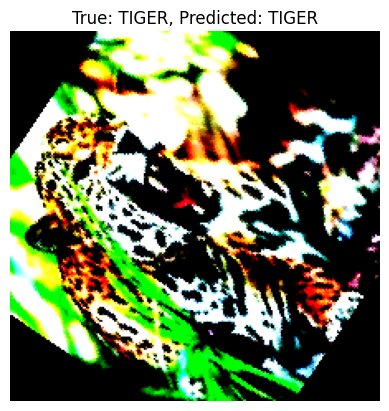

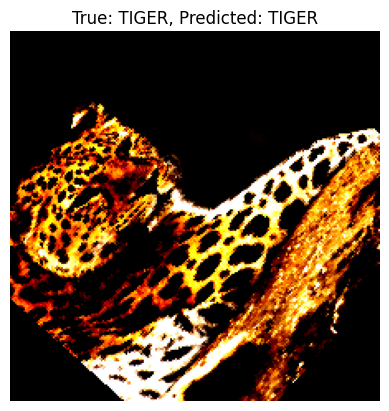

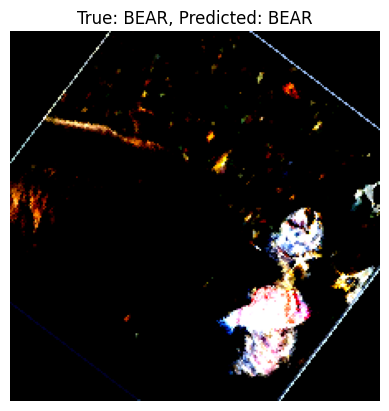

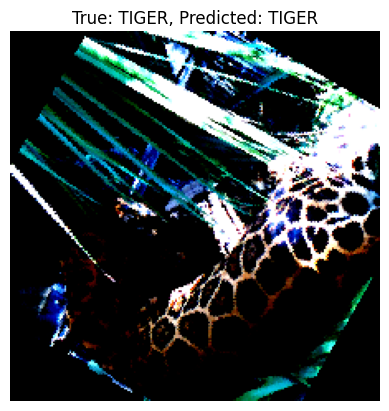

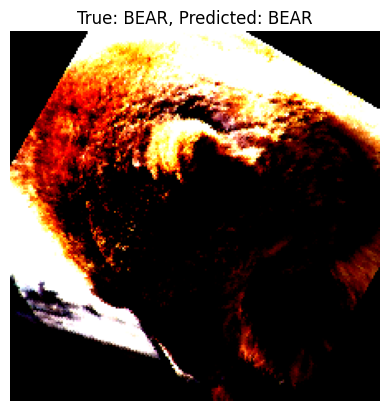

Misclassified images:


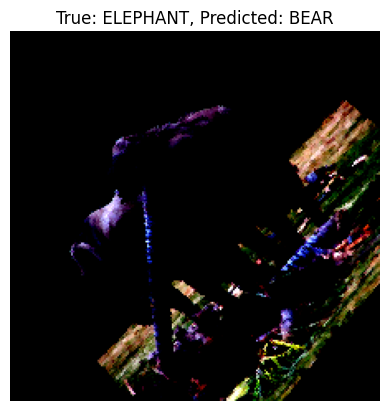

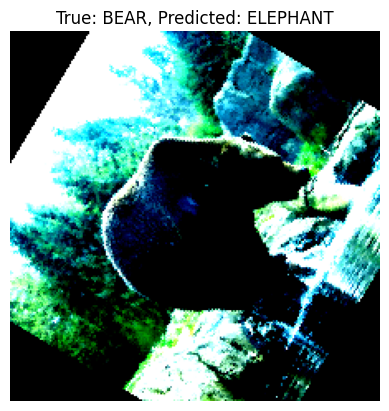

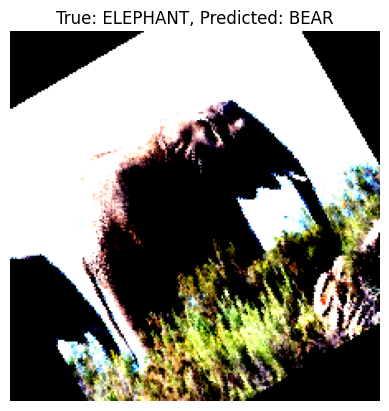

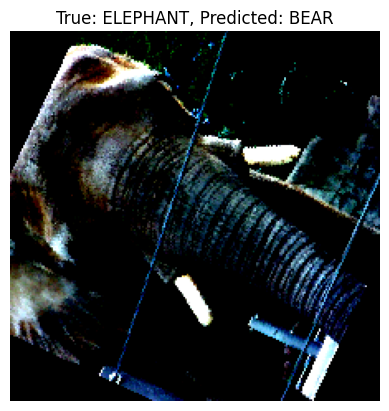

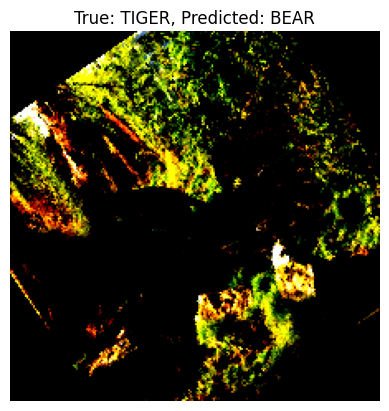

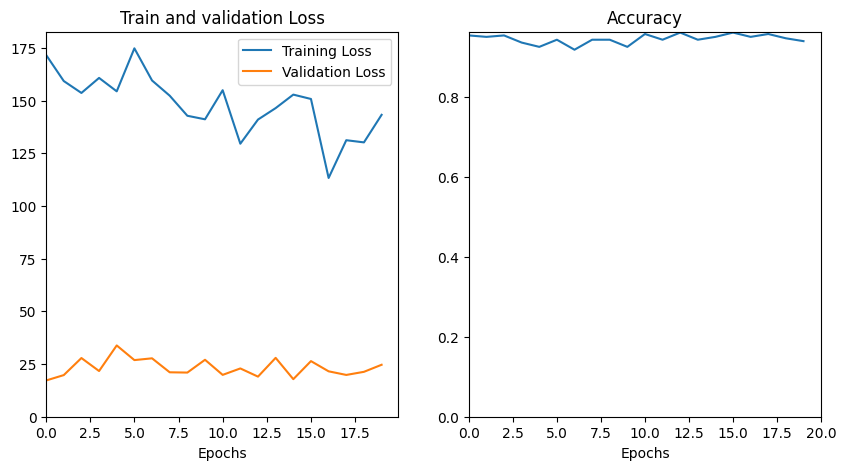

Average Accuracy: 0.8992857142857142


In [23]:
accuracy_scores = []
for fold, (train_indices, val_indices) in enumerate(kf.split(dataset)):
  print(f"Fold {fold + 1}/{k_folds}")
  train_sampler = torch.utils.data.SubsetRandomSampler(train_indices)
  val_sampler = torch.utils.data.SubsetRandomSampler(val_indices)
  train_loader = DataLoader(dataset, batch_size=32, sampler=train_sampler)
  val_loader = DataLoader(dataset, batch_size=32, sampler=val_sampler)
  accuracy = train_log_loss_network(model_fully_conv, train_loader, val_loader, epochs=20, device=device)
  accuracy_scores.append(accuracy)
avg_accuracy = sum(accuracy_scores) / k_folds
print(f"Average Accuracy: {avg_accuracy}")

### TRANSFER LEARNING


I decided to use VGG16 due to its high accuracy.

In [24]:
from torchvision import models
model = models.vgg16(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 195MB/s]


In [25]:
# Freeze model weights
for param in model.parameters():
    param.requires_grad = False

In [26]:
model.classifier[6] = nn.Sequential(
                      nn.Linear(4096, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, C),
                      nn.LogSoftmax(dim=1))

Loss after epoch 1 is 269.03308705985546. Accuracy: 0.9714285714285714
Loss after epoch 2 is 129.1053023338318. Accuracy: 0.9821428571428571
Loss after epoch 3 is 118.50921083241701. Accuracy: 0.9785714285714285
Loss after epoch 4 is 113.28794765472412. Accuracy: 0.9821428571428571
Loss after epoch 5 is 94.22532814741135. Accuracy: 0.975
Loss after epoch 6 is 110.87068620324135. Accuracy: 0.9821428571428571
Loss after epoch 7 is 67.19575167447329. Accuracy: 0.9785714285714285
Loss after epoch 8 is 72.66001542285085. Accuracy: 0.9857142857142858
Loss after epoch 9 is 78.59251940250397. Accuracy: 0.9857142857142858
Loss after epoch 10 is 81.63494586199522. Accuracy: 0.9857142857142858
Loss after epoch 11 is 77.5647843182087. Accuracy: 0.9785714285714285
Loss after epoch 12 is 82.01969518512487. Accuracy: 0.9678571428571429
Loss after epoch 13 is 83.12485094740987. Accuracy: 0.9964285714285714
Loss after epoch 14 is 101.03325998783112. Accuracy: 0.9785714285714285
Loss after epoch 15 is 5

Loss after epoch 20 is 57.373762007802725. Accuracy: 0.9821428571428571
Correctly classified images:


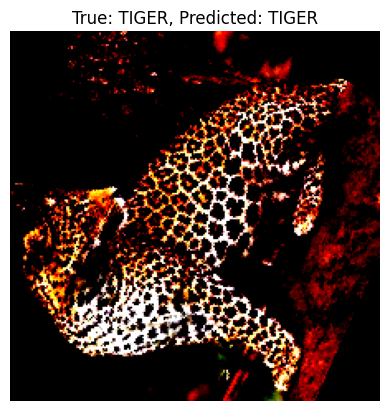

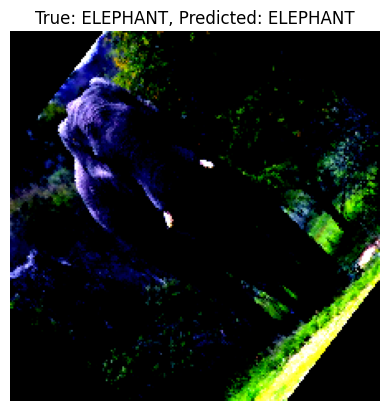

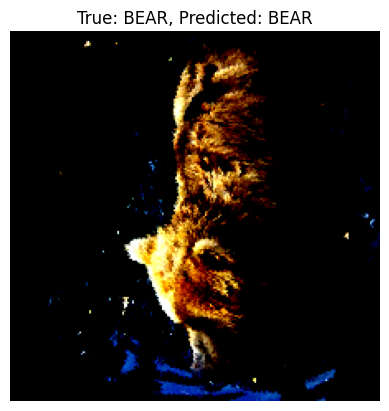

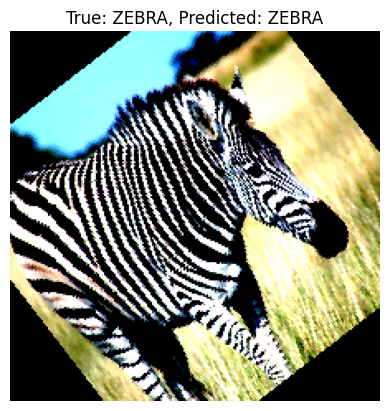

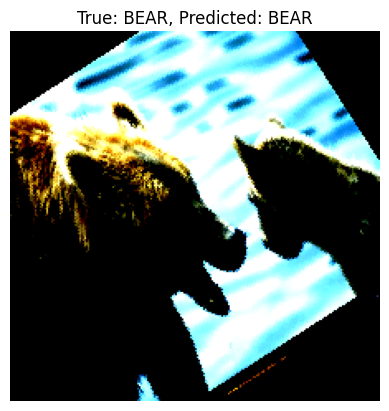

Misclassified images:


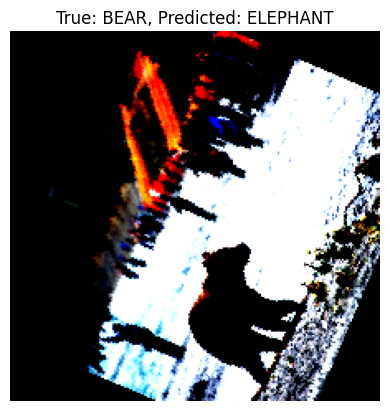

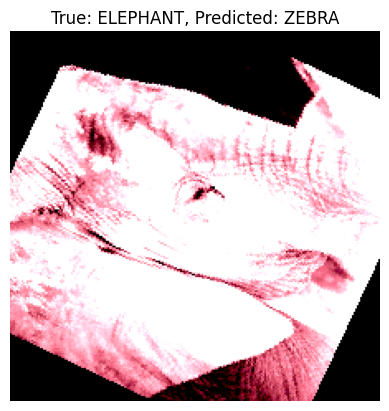

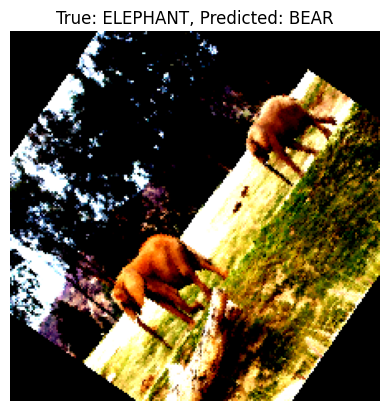

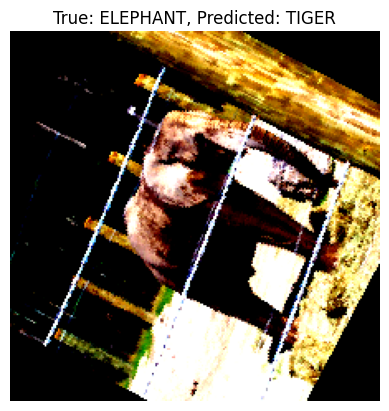

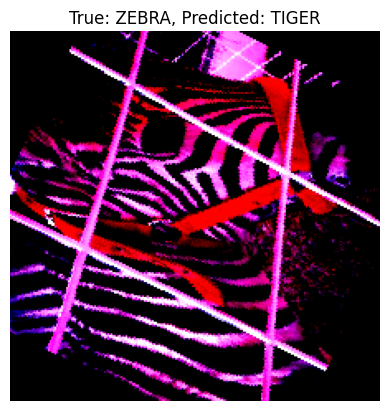

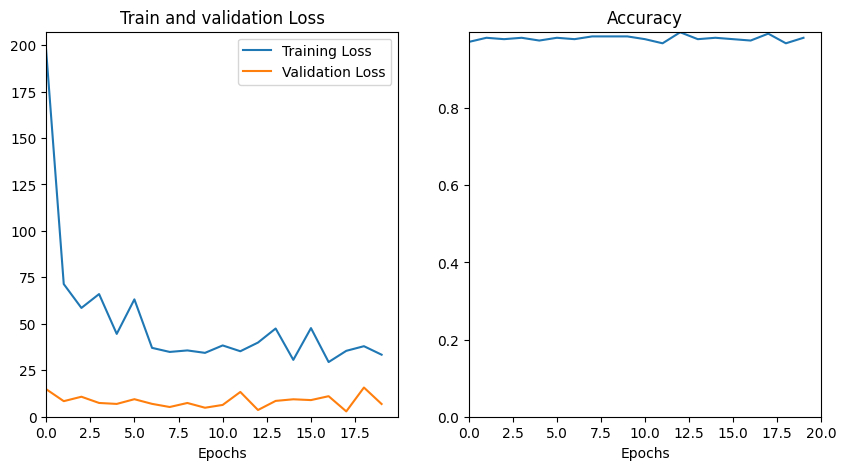

0.9821428571428571

In [27]:
train_log_loss_network(model, train_loader, val_loader, epochs=20, device=device)

## COMPARISON

Remember the model summaries

This is the model from scratch. Lets say this is model-1

In [28]:
summary(model_fully_conv,(3, H, W))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
         Dropout2d-3         [-1, 64, 224, 224]               0
              ReLU-4         [-1, 64, 224, 224]               0
            Conv2d-5         [-1, 64, 224, 224]          36,928
       BatchNorm2d-6         [-1, 64, 224, 224]             128
         Dropout2d-7         [-1, 64, 224, 224]               0
         MaxPool2d-8         [-1, 64, 112, 112]               0
              ReLU-9         [-1, 64, 112, 112]               0
           Conv2d-10        [-1, 128, 112, 112]          73,856
      BatchNorm2d-11        [-1, 128, 112, 112]             256
        Dropout2d-12        [-1, 128, 112, 112]               0
        MaxPool2d-13          [-1, 128, 56, 56]               0
             ReLU-14          [-1, 128,

This is model with transfer learning. Lets say this is model-2

In [29]:
summary(model,(3, H, W))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

### Architecture comparison:

- We can clearly see that their architecture is quite different.
- Model-2 has 135m params while Model-1 has only 273k.
- Also Model-2 has significantly more layer than model-1.
- But model-1 has regularization in every layer while regularization is not used often in model-2.
- They both use ReLU activation function

### Performance comparison:

- Model-2 has seen Accuracy of 0.996. Model-1 has average accuracy of 0.897 in 5-fold cross-validation.

### Training and convergence

- Model-1 has stable validation loss and slowly decreasing training loss. It may have reached its capacity.
- Model-2 has fast decreasing training loss and stable validation loss which is ideal.